In [66]:
import pandas as pd
import geopandas as gpd
import numpy as np
!pip install hvplot
import hvplot.pandas  
!pip install geoviews
import geoviews as gv

# See lots of columns
pd.options.display.max_columns = 999

# Hide warnings due to issue in shapely package 
# See: https://github.com/shapely/shapely/issues/1345
np.seterr(invalid="ignore");

# Assignment 3

This assignment will contain two parts:

1. Exploring evictions and code violations in Philadelphia
2. Comparing the NDVI in Philadelphia

## Part 1: Exploring Evictions and Code Violations in Philadelphia

In this assignment, we'll explore spatial trends evictions in Philadelphia using data from the [Eviction Lab](https://evictionlab.org/) and building code violations using data from [OpenDataPhilly](https://www.opendataphilly.org/).

We'll be exploring the idea that evictions can occur as retaliation against renters for reporting code violations. Spatial correlations between evictions and code violations from the City's Licenses and Inspections department can offer some insight into this question. 

**A couple of interesting background readings:**
- [HuffPost article](https://www.huffingtonpost.com/entry/cities-are-starting-to-pay-attention-to-the-eviction-crisis-thats-devastated-poor-tenants_us_5b1a7b21e4b0bbb7a0dbd59e)
- [PlanPhilly article](http://planphilly.com/articles/2018/04/12/philly-landlords-evict-more-people-than-owners-in-other-large-cities)

## 1.1 Explore Eviction Lab Data

The Eviction Lab built the first national database for evictions. If you aren't familiar with the project, you can explore their website: https://evictionlab.org/ 

### 1.1.1 Read data using `geopandas`

The first step is to read the eviction data by census tract using `geopandas`. The data for all of Pennsylvania by census tract is available in the `data/` folder in a GeoJSON format.

Load the data file "PA-tracts.geojson" using `geopandas`

**Note:** If you'd like to see all columns in the data frame, you can increase the max number of columns using pandas display options:

In [67]:
tracts = gpd.read_file("./data/PA-tracts.geojson")

In [68]:
pd.set_option("display.max_columns", None)
tracts.head()

,GEOID,west,south,east,north,n,pl,p-00,pr-00,roh-00,pro-00,mgr-00,mhi-00,mpv-00,rb-00,pw-00,paa-00,ph-00,pai-00,pa-00,pnp-00,pm-00,po-00,ef-00,e-00,er-00,efr-00,lf-00,imputed-00,subbed-00,p-01,pr-01,roh-01,pro-01,mgr-01,mhi-01,mpv-01,rb-01,pw-01,paa-01,ph-01,pai-01,pa-01,pnp-01,pm-01,po-01,ef-01,e-01,er-01,efr-01,lf-01,imputed-01,subbed-01,p-02,pr-02,roh-02,pro-02,mgr-02,mhi-02,mpv-02,rb-02,pw-02,paa-02,ph-02,pai-02,pa-02,pnp-02,pm-02,po-02,ef-02,e-02,er-02,efr-02,lf-02,imputed-02,subbed-02,p-03,pr-03,roh-03,pro-03,mgr-03,mhi-03,mpv-03,rb-03,pw-03,paa-03,ph-03,pai-03,pa-03,pnp-03,pm-03,po-03,ef-03,e-03,er-03,efr-03,lf-03,imputed-03,subbed-03,p-04,pr-04,roh-04,pro-04,mgr-04,mhi-04,mpv-04,rb-04,pw-04,paa-04,ph-04,pai-04,pa-04,pnp-04,pm-04,po-04,ef-04,e-04,er-04,efr-04,lf-04,imputed-04,subbed-04,p-05,pr-05,roh-05,pro-05,mgr-05,mhi-05,mpv-05,rb-05,pw-05,paa-05,ph-05,pai-05,pa-05,pnp-05,pm-05,po-05,ef-05,e-05,er-05,efr-05,lf-05,imputed-05,subbed-05,p-06,pr-06,roh-06,pro-06,mgr-06,mhi-06,mpv-06,rb-06,pw-06,paa-06,ph-06,pai-06,pa-06,pnp-06,pm-06,po-06,ef-06,e-06,er-06,efr-06,lf-06,imputed-06,subbed-06,p-07,pr-07,roh-07,pro-07,mgr-07,mhi-07,mpv-07,rb-07,pw-07,paa-07,ph-07,pai-07,pa-07,pnp-07,pm-07,po-07,ef-07,e-07,er-07,efr-07,lf-07,imputed-07,subbed-07,p-08,pr-08,roh-08,pro-08,mgr-08,mhi-08,mpv-08,rb-08,pw-08,paa-08,ph-08,pai-08,pa-08,pnp-08,pm-08,po-08,ef-08,e-08,er-08,efr-08,lf-08,imputed-08,subbed-08,p-09,pr-09,roh-09,pro-09,mgr-09,mhi-09,mpv-09,rb-09,pw-09,paa-09,ph-09,pai-09,pa-09,pnp-09,pm-09,po-09,ef-09,e-09,er-09,efr-09,lf-09,imputed-09,subbed-09,p-10,pr-10,roh-10,pro-10,mgr-10,mhi-10,mpv-10,rb-10,pw-10,paa-10,ph-10,pai-10,pa-10,pnp-10,pm-10,po-10,ef-10,e-10,er-10,efr-10,lf-10,imputed-10,subbed-10,p-11,pr-11,roh-11,pro-11,mgr-11,mhi-11,mpv-11,rb-11,pw-11,paa-11,ph-11,pai-11,pa-11,pnp-11,pm-11,po-11,ef-11,e-11,er-11,efr-11,lf-11,imputed-11,subbed-11,p-12,pr-12,roh-12,pro-12,mgr-12,mhi-12,mpv-12,rb-12,pw-12,paa-12,ph-12,pai-12,pa-12,pnp-12,pm-12,po-12,ef-12,e-12,er-12,efr-12,lf-12,imputed-12,subbed-12,p-13,pr-13,roh-13,pro-13,mgr-13,mhi-13,mpv-13,rb-13,pw-13,paa-13,ph-13,pai-13,pa-13,pnp-13,pm-13,po-13,ef-13,e-13,er-13,efr-13,lf-13,imputed-13,subbed-13,p-14,pr-14,roh-14,pro-14,mgr-14,mhi-14,mpv-14,rb-14,pw-14,paa-14,ph-14,pai-14,pa-14,pnp-14,pm-14,po-14,ef-14,e-14,er-14,efr-14,lf-14,imputed-14,subbed-14,p-15,pr-15,roh-15,pro-15,mgr-15,mhi-15,mpv-15,rb-15,pw-15,paa-15,ph-15,pai-15,pa-15,pnp-15,pm-15,po-15,ef-15,e-15,er-15,efr-15,lf-15,imputed-15,subbed-15,p-16,pr-16,roh-16,pro-16,mgr-16,mhi-16,mpv-16,rb-16,pw-16,paa-16,ph-16,pai-16,pa-16,pnp-16,pm-16,po-16,ef-16,e-16,er-16,efr-16,lf-16,imputed-16,subbed-16,geometry
0,42003412002,-80.1243,40.5422,-80.0640,40.5890,4120.02,"Allegheny County, Pennsylvania",4748.59,0.88,58.0,3.66,949.31,89226.06,195358.33,22.82,94.89,0.84,0.43,0.06,2.83,0.33,0.62,0.00,1.0,1.0,1.73,1.73,0.0,0.0,0.0,4748.59,0.88,59.0,3.66,949.31,89226.06,195358.33,22.82,94.89,0.84,0.43,0.06,2.83,0.33,0.62,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,4748.59,0.88,60.0,3.66,949.31,89226.06,195358.33,22.82,94.89,0.84,0.43,0.06,2.83,0.33,0.62,0.00,3.0,0.0,0.00,4.99,0.0,0.0,0.0,4748.59,0.88,61.0,3.66,949.31,89226.06,195358.33,22.82,94.89,0.84,0.43,0.06,2.83,0.33,0.62,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,4748.59,0.88,62.0,3.66,949.31,89226.06,195358.33,22.82,94.89,0.84,0.43,0.06,2.83,0.33,0.62,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,4525.07,0.93,63.0,5.83,799.06,117867.25,267511.43,13.86,89.33,1.42,2.65,0.00,6.41,0.0,0.00,0.19,1.0,0.0,0.00,1.58,0.0,0.0,0.0,4525.07,0.93,65.0,5.83,799.06,117867.25,267511.43,13.86,89.33,1.42,2.65,0.00,6.41,0.0,0.00,0.19,0.0,0.0,0.00,0.00,0.0,0.0,0.0,4525.07,0.93,66.0,5.83,799.06,117867.25,267511.43,13.86,89.33,1.42,2.65,0.00,6.41,0.0,0.00,0.19,0.0,0.0,0.00,0.00,0.0,0.0,1.0,4525.07,0.93,67.0,5.83,799.06,117867.25,267511.43,13.86,89.33,1.42,2.65,0.00,6.41,0.0,0.00,0.19,5.0,4.0,5.99,7.49,0.0,0.0,1.0,4525.07,0.93,68.0,5.83,799.06,117867.25,267511.43,13.86,89.33,1.42,2.65,0.00,6.41,0.0,0.00,0.19,2.0,1.0,1.47,2.95,0.

In [69]:
eviction_cols = [col for col in tracts.columns if col.startswith("e-")]
print(eviction_cols)

['e-00', 'e-01', 'e-02', 'e-03', 'e-04', 'e-05', 'e-06', 'e-07', 'e-08', 'e-09', 'e-10', 'e-11', 'e-12', 'e-13', 'e-14', 'e-15', 'e-16']


### 1.1.2 Explore and trim the data 

We will need to trim data to Philadelphia only. Take a look at the data dictionary for the descriptions of the various columns in top-level repository folder: `eviction_lab_data_dictionary.txt`

**Note:** the column names are shortened — see the end of the above file for the abbreviations. The numbers at the end of the columns indicate the years. For example, `e-16` is the number of evictions in 2016. 

Take a look at the individual columns and trim to census tracts in Philadelphia. (**Hint:** Philadelphia is both a city and a county).

In [70]:
tracts["pl"].unique()

array(['Allegheny County, Pennsylvania', 'Armstrong County, Pennsylvania',
       'Beaver County, Pennsylvania', 'Berks County, Pennsylvania',
       'Blair County, Pennsylvania', 'Bradford County, Pennsylvania',
       'Bucks County, Pennsylvania', 'Adams County, Pennsylvania',
       'Butler County, Pennsylvania', 'Cambria County, Pennsylvania',
       'Chester County, Pennsylvania', 'Clarion County, Pennsylvania',
       'Clearfield County, Pennsylvania', 'Clinton County, Pennsylvania',
       'Columbia County, Pennsylvania', 'Crawford County, Pennsylvania',
       'Cumberland County, Pennsylvania', 'Dauphin County, Pennsylvania',
       'Delaware County, Pennsylvania', 'Carbon County, Pennsylvania',
       'Centre County, Pennsylvania', 'Elk County, Pennsylvania',
       'Erie County, Pennsylvania', 'Juniata County, Pennsylvania',
       'Lackawanna County, Pennsylvania',
       'Lancaster County, Pennsylvania', 'Lawrence County, Pennsylvania',
       'Lebanon County, Pennsylvania'

In [71]:
philly_tracts = tracts[tracts["pl"] == "Philadelphia County, Pennsylvania"]


### 1.1.3 Transform from wide to tidy format

For this assignment, we are interested in the number of evictions by census tract for various years. Right now, each year has it's own column, so it will be easiest to transform to a tidy format. 

Use the `pd.melt()` function to transform the eviction data into tidy format, using the number of evictions from **2003 to 2016**.

The tidy data frame should have four columns: `GEOID`, `geometry`, a column holding the number of evictions, and a column telling you what the name of the original column was for that value.

**Hints:**
- You'll want to specify the `GEOID` and `geometry` columns as the `id_vars`. This will keep track of the census tract information. 
- You should specify the names of the columns holding the number of evictions as the `value_vars`.
- You can generate a list of this column names using Python's f-string formatting:
    ```python
    value_vars = [f"e-{x:02d}" for x in range(3, 17)]
    ```

In [72]:
# 2003-2006
value_vars = [f"e-{x:02d}" for x in range(3, 17)]

# tidy
philly_tidy = pd.melt(
    philly_tracts,
    id_vars=["GEOID", "geometry"],
    value_vars=value_vars,
    var_name="year_col",
    value_name="evictions"
)

# e-03 -> 2003
philly_tidy["year"] = philly_tidy["year_col"].str.replace("e-", "20").astype(int)

philly_tidy.head()


,GEOID,geometry,year_col,evictions,year
0,42101000100,"MULTIPOLYGON (((-75.14161 39.95549, -75.14162 ...",e-03,21.0,2003
1,42101000200,"MULTIPOLYGON (((-75.15122 39.95686, -75.15167 ...",e-03,3.0,2003
2,42101000300,"MULTIPOLYGON (((-75.16234 39.95782, -75.16237 ...",e-03,17.0,2003
3,42101000801,"MULTIPOLYGON (((-75.17732 39.95096, -75.17784 ...",e-03,13.0,2003
4,42101000804,"MULTIPOLYGON (((-75.17118 39.94778, -75.17102 ...",e-03,21.0,2003


### 1.1.4 Plot the total number of evictions per year from 2003 to 2016

Use `hvplot` to plot the total number of evictions from 2003 to 2016. You will first need to perform a group by operation and sum up the total number of evictions for all census tracts, and then use `hvplot()` to make your plot.

You can use any type of `hvplot` chart you'd like to show the trend in number of evictions over time.

In [73]:
import hvplot.pandas  

# group by year and sum evictions
yearly_evictions = philly_tidy.groupby("year")["evictions"].sum().reset_index()

# plot
yearly_evictions.hvplot.line(
    x="year", 
    y="evictions", 
    title="Total Evictions per Year (2003–2016)",
    xlabel="Year", 
    ylabel="Number of Evictions",
    line_width=2, 
    marker="o"
)


:Curve   [year]   (evictions)

### 1.1.5 The number of evictions across Philadelphia

Our tidy data frame is still a GeoDataFrame with a geometry column, so we can visualize the number of evictions for all census tracts. 

Use `hvplot()` to generate a choropleth showing the number of evictions for a specified year, with a widget dropdown to select a given year (or variable name, e.g., `e-16`, `e-15`, etc). 

**Hints** 
- You'll need to use the `groupby` keyword to tell `hvplot` to make a series of maps, with a widget to select between them.
- You will need to specify `dynamic=False` as a keyword argument to the `hvplot()` function. 
- Be sure to specify a `width` and `height` that makes your output map (roughly) square to limit distortions

In [74]:
# plot tracts with evictions
philly_tidy.hvplot.polygons(
    c="evictions",        
    cmap="Reds",          
    groupby="year",       
    dynamic=False,        
    width=500, 
    height=500, 
    title="Evictions in Philadelphia by Census Tract (2003–2016)"
)


:HoloMap   [year]
   :Polygons   [x,y]   (evictions)

## 1.2 Code Violations in Philadelphia

Next, we'll explore data for code violations from the Licenses and Inspections Department of Philadelphia to look for potential correlations with the number of evictions.


### 1.2.1 Load data from 2012 to 2016

L+I violation data for years including 2012 through 2016 (inclusive) is provided in a CSV format in the "data/" folder. 

Load the data using pandas and convert to a GeoDataFrame.

In [75]:
violations = pd.read_csv("./data/li_violations.csv")

violations.head()

,lat,lng,violationdescription
0,40.050526,-75.126076,CLIP VIOLATION NOTICE
1,40.050593,-75.126578,LICENSE-CHANGE OF ADDRESS
2,40.050593,-75.126578,LICENSE-RES SFD/2FD
3,39.991994,-75.128895,EXT A-CLEAN WEEDS/PLANTS
4,40.023260,-75.164848,EXT A-VACANT LOT CLEAN/MAINTAI


In [76]:
from shapely.geometry import Point


violations_gdf = gpd.GeoDataFrame(
    violations,
    geometry = gpd.points_from_xy(violations["lng"], violations["lat"]),
    crs="EPSG:4326"  
)

violations_gdf.head()


,lat,lng,violationdescription,geometry
0,40.050526,-75.126076,CLIP VIOLATION NOTICE,POINT (-75.12608 40.05053)
1,40.050593,-75.126578,LICENSE-CHANGE OF ADDRESS,POINT (-75.12658 40.05059)
2,40.050593,-75.126578,LICENSE-RES SFD/2FD,POINT (-75.12658 40.05059)
3,39.991994,-75.128895,EXT A-CLEAN WEEDS/PLANTS,POINT (-75.1289 39.99199)
4,40.023260,-75.164848,EXT A-VACANT LOT CLEAN/MAINTAI,POINT (-75.16485 40.02326)


### 1.2.2 Trim to specific violation types

There are many different types of code violations (running the `nunique()` function on the `violationdescription` column will extract all of the unique ones). More information on different types of violations can be found [on the City's website](https://www.phila.gov/li/codesandregulations/Pages/codes.aspx).

Below, I've selected 15 types of violations that deal with property maintenance and licensing issues. We'll focus on these violations. The goal is to see if these kinds of violations are correlated spatially with the number of evictions in a given area. 

Use the list of violations given to trim your data set to only include these types.

In [77]:
violation_types = [
    "INT-PLMBG MAINT FIXTURES-RES",
    "INT S-CEILING REPAIR/MAINT SAN",
    "PLUMBING SYSTEMS-GENERAL",
    "CO DETECTOR NEEDED",
    "INTERIOR SURFACES",
    "EXT S-ROOF REPAIR",
    "ELEC-RECEPTABLE DEFECTIVE-RES",
    "INT S-FLOOR REPAIR",
    "DRAINAGE-MAIN DRAIN REPAIR-RES",
    "DRAINAGE-DOWNSPOUT REPR/REPLC",
    "LIGHT FIXTURE DEFECTIVE-RES",
    "LICENSE-RES SFD/2FD",
    "ELECTRICAL -HAZARD",
    "VACANT PROPERTIES-GENERAL",
    "INT-PLMBG FIXTURES-RES",
]

In [78]:
violations_trimed = violations_gdf[violations_gdf["violationdescription"].isin(violation_types)]

violations_trimed.head()

,lat,lng,violationdescription,geometry
2,40.050593,-75.126578,LICENSE-RES SFD/2FD,POINT (-75.12658 40.05059)
25,40.022406,-75.121872,EXT S-ROOF REPAIR,POINT (-75.12187 40.02241)
30,40.023237,-75.121726,CO DETECTOR NEEDED,POINT (-75.12173 40.02324)
31,40.023397,-75.122241,INT S-CEILING REPAIR/MAINT SAN,POINT (-75.12224 40.0234)
34,40.023773,-75.121603,INT S-FLOOR REPAIR,POINT (-75.1216 40.02377)


### 1.2.3 Make a hex bin map

The code violation data is **point data**. We can get a quick look at the geographic distribution using `matplotlib` and the `hexbin()` function. Make a hex bin map of the code violations and overlay the census tract outlines. 

**Hints**:
- The eviction data from part 1 was by census tract, so the census tract geometries are available as part of that GeoDataFrame. You can use it to overlay the census tracts on your hex bin map.
- Make sure you convert your GeoDataFrame to a CRS that's better for visualization than plain old 4326.

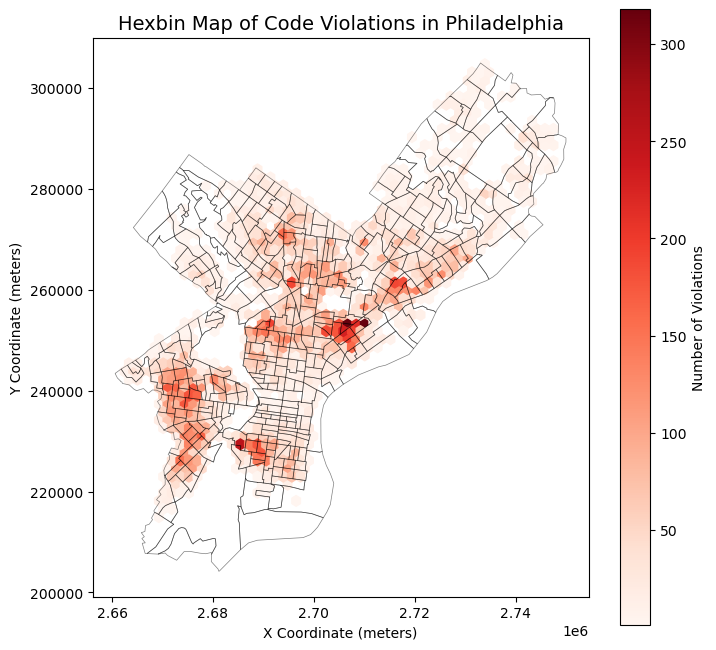

In [79]:
import matplotlib.pyplot as plt

# convert to local projection
violations_proj = violations_trimed.to_crs(epsg=2272)
philly_tracts_proj = philly_tracts.to_crs(epsg=2272)

# create a hexbin plot
fig, ax = plt.subplots(figsize=(8, 8))

hb = ax.hexbin(
    violations_proj.geometry.x,   
    violations_proj.geometry.y,   
    gridsize=50,                  
    cmap="Reds",                  
    mincnt=1                      
)

# Add colorbar
cb = fig.colorbar(hb, ax=ax)
cb.set_label("Number of Violations")

# Overlay tract boundaries with thin transparent lines
philly_tracts_proj.boundary.plot(ax=ax, color="black", linewidth=0.5, alpha=0.5)

# Titles and labels
ax.set_title("Hexbin Map of Code Violations in Philadelphia", fontsize=14)
ax.set_xlabel("X Coordinate (meters)")
ax.set_ylabel("Y Coordinate (meters)")

plt.show()

### 1.2.4 Spatially join data sets

To do a census tract comparison to our eviction data, we need to find which census tract each of the code violations falls into. Use the `geopandas.sjoin()` function to do just that. 


**Hints**
- You can re-use your eviction data frame, but you will only need the `geometry` column (specifying census tract polygons) and the `GEOID` column (specifying the name of each census tract).
- Make sure both data frames have the same CRS before joining them together!

In [80]:
# Spatial join: assign each violation to a tract
violations_with_tracts = gpd.sjoin(
    violations_proj,
    philly_tracts_proj[["GEOID", "geometry"]],
    how="left",
    predicate="within"
)

violations_with_tracts.head()

,lat,lng,violationdescription,geometry,index_right,GEOID
2,40.050593,-75.126578,LICENSE-RES SFD/2FD,POINT (2702822.702 272195.134),3185,42101027100
25,40.022406,-75.121872,EXT S-ROOF REPAIR,POINT (2704445.089 261970.779),2238,42101028800
30,40.023237,-75.121726,CO DETECTOR NEEDED,POINT (2704476.954 262274.581),2238,42101028800
31,40.023397,-75.122241,INT S-CEILING REPAIR/MAINT SAN,POINT (2704331.05 262328.549),2238,42101028800
34,40.023773,-75.121603,INT S-FLOOR REPAIR,POINT (2704505.576 262470.776),2238,42101028800


### 1.2.5 Calculate the number of violations by type per census tract

Next, we'll want to find the number of violations (for each kind) per census tract. You should group the data frame by violation type and census tract name.

The result of this step should be a data frame with three columns: `violationdescription`, `GEOID`, and `N`, where `N` is the number of violations of that kind in the specified census tract.

**Optional: to make prettier plots**

Some census tracts won't have any violations, and they won't be included when we do the above calculation. However, there is a trick to set the values for those census tracts to be zero. After you calculate the sizes of each violation/census tract group, you can run: 

```python
N = N.unstack(fill_value=0).stack().reset_index(name='N')
```
where `N` gives the total size of each of the groups, specified by violation type and census tract name.

See [this StackOverflow post](https://stackoverflow.com/questions/42854801/including-missing-combinations-of-values-in-a-pandas-groupby-aggregation) for more details.

This part is **optional**, but will make the resulting maps a bit prettier.

In [81]:
N = violations_with_tracts.groupby(["violationdescription", "GEOID"]).size()
N = N.unstack(fill_value=0).stack().reset_index(name='N')
N.head()

,violationdescription,GEOID,N
0,CO DETECTOR NEEDED,42101000100,0
1,CO DETECTOR NEEDED,42101000200,0
2,CO DETECTOR NEEDED,42101000300,0
3,CO DETECTOR NEEDED,42101000401,1
4,CO DETECTOR NEEDED,42101000402,1


### 1.2.6 Merge with census tracts geometries

We now have the number of violations of different types per census tract specified as a regular DataFrame. You can now merge it with the census tract geometries (from your eviction data GeoDataFrame) to create a GeoDataFrame. 

**Hints**
- Use `pandas.merge()` and specify the `on` keyword to be the column holding census tract names. 
- Make sure the result of the merge operation is a GeoDataFrame — you will want the GeoDataFrame holding census tract geometries to be the first argument of the `pandas.merge()` function.

In [82]:
violations_by_tract = philly_tracts_proj.merge(
    N, on="GEOID", how="left"
)

violations_by_tract.head()



,GEOID,west,south,east,north,n,pl,p-00,pr-00,roh-00,pro-00,mgr-00,mhi-00,mpv-00,rb-00,pw-00,paa-00,ph-00,pai-00,pa-00,pnp-00,pm-00,po-00,ef-00,e-00,er-00,efr-00,lf-00,imputed-00,subbed-00,p-01,pr-01,roh-01,pro-01,mgr-01,mhi-01,mpv-01,rb-01,pw-01,paa-01,ph-01,pai-01,pa-01,pnp-01,pm-01,po-01,ef-01,e-01,er-01,efr-01,lf-01,imputed-01,subbed-01,p-02,pr-02,roh-02,pro-02,mgr-02,mhi-02,mpv-02,rb-02,pw-02,paa-02,ph-02,pai-02,pa-02,pnp-02,pm-02,po-02,ef-02,e-02,er-02,efr-02,lf-02,imputed-02,subbed-02,p-03,pr-03,roh-03,pro-03,mgr-03,mhi-03,mpv-03,rb-03,pw-03,paa-03,ph-03,pai-03,pa-03,pnp-03,pm-03,po-03,ef-03,e-03,er-03,efr-03,lf-03,imputed-03,subbed-03,p-04,pr-04,roh-04,pro-04,mgr-04,mhi-04,mpv-04,rb-04,pw-04,paa-04,ph-04,pai-04,pa-04,pnp-04,pm-04,po-04,ef-04,e-04,er-04,efr-04,lf-04,imputed-04,subbed-04,p-05,pr-05,roh-05,pro-05,mgr-05,mhi-05,mpv-05,rb-05,pw-05,paa-05,ph-05,pai-05,pa-05,pnp-05,pm-05,po-05,ef-05,e-05,er-05,efr-05,lf-05,imputed-05,subbed-05,p-06,pr-06,roh-06,pro-06,mgr-06,mhi-06,mpv-06,rb-06,pw-06,paa-06,ph-06,pai-06,pa-06,pnp-06,pm-06,po-06,ef-06,e-06,er-06,efr-06,lf-06,imputed-06,subbed-06,p-07,pr-07,roh-07,pro-07,mgr-07,mhi-07,mpv-07,rb-07,pw-07,paa-07,ph-07,pai-07,pa-07,pnp-07,pm-07,po-07,ef-07,e-07,er-07,efr-07,lf-07,imputed-07,subbed-07,p-08,pr-08,roh-08,pro-08,mgr-08,mhi-08,mpv-08,rb-08,pw-08,paa-08,ph-08,pai-08,pa-08,pnp-08,pm-08,po-08,ef-08,e-08,er-08,efr-08,lf-08,imputed-08,subbed-08,p-09,pr-09,roh-09,pro-09,mgr-09,mhi-09,mpv-09,rb-09,pw-09,paa-09,ph-09,pai-09,pa-09,pnp-09,pm-09,po-09,ef-09,e-09,er-09,efr-09,lf-09,imputed-09,subbed-09,p-10,pr-10,roh-10,pro-10,mgr-10,mhi-10,mpv-10,rb-10,pw-10,paa-10,ph-10,pai-10,pa-10,pnp-10,pm-10,po-10,ef-10,e-10,er-10,efr-10,lf-10,imputed-10,subbed-10,p-11,pr-11,roh-11,pro-11,mgr-11,mhi-11,mpv-11,rb-11,pw-11,paa-11,ph-11,pai-11,pa-11,pnp-11,pm-11,po-11,ef-11,e-11,er-11,efr-11,lf-11,imputed-11,subbed-11,p-12,pr-12,roh-12,pro-12,mgr-12,mhi-12,mpv-12,rb-12,pw-12,paa-12,ph-12,pai-12,pa-12,pnp-12,pm-12,po-12,ef-12,e-12,er-12,efr-12,lf-12,imputed-12,subbed-12,p-13,pr-13,roh-13,pro-13,mgr-13,mhi-13,mpv-13,rb-13,pw-13,paa-13,ph-13,pai-13,pa-13,pnp-13,pm-13,po-13,ef-13,e-13,er-13,efr-13,lf-13,imputed-13,subbed-13,p-14,pr-14,roh-14,pro-14,mgr-14,mhi-14,mpv-14,rb-14,pw-14,paa-14,ph-14,pai-14,pa-14,pnp-14,pm-14,po-14,ef-14,e-14,er-14,efr-14,lf-14,imputed-14,subbed-14,p-15,pr-15,roh-15,pro-15,mgr-15,mhi-15,mpv-15,rb-15,pw-15,paa-15,ph-15,pai-15,pa-15,pnp-15,pm-15,po-15,ef-15,e-15,er-15,efr-15,lf-15,imputed-15,subbed-15,p-16,pr-16,roh-16,pro-16,mgr-16,mhi-16,mpv-16,rb-16,pw-16,paa-16,ph-16,pai-16,pa-16,pnp-16,pm-16,po-16,ef-16,e-16,er-16,efr-16,lf-16,imputed-16,subbed-16,geometry,violationdescription,N
0,42101000100,-75.1523,39.9481,-75.1415,39.9569,1,"Philadelphia County, Pennsylvania",2646.71,9.26,1347.0,77.12,959.0,48886.0,189700.0,24.5,78.45,12.42,3.47,0.23,3.92,0.0,1.4,0.11,NaN,NaN,NaN,NaN,0.0,0.0,0.0,2646.71,9.26,1360.0,77.12,959.0,48886.0,189700.0,24.5,78.45,12.42,3.47,0.23,3.92,0.0,1.4,0.11,NaN,NaN,NaN,NaN,0.0,0.0,0.0,2646.71,9.26,1374.0,77.12,959.0,48886.0,189700.0,24.5,78.45,12.42,3.47,0.23,3.92,0.0,1.4,0.11,21.0,19.0,1.38,1.53,1.0,0.0,0.0,2646.71,9.26,1388.0,77.12,959.0,48886.0,189700.0,24.5,78.45,12.42,3.47,0.23,3.92,0.0,1.4,0.11,25.0,21.0,1.51,1.8,1.0,0.0,0.0,2646.71,9.26,1401.0,77.12,959.0,48886.0,189700.0,24.5,78.45,12.42,3.47,0.23,3.92,0.0,1.4,0.11,25.0,24.0,1.71,1.78,1.0,0.0,0.0,3310.88,12.11,1415.0,57.97,1357.0,73272.0,332500.0,25.6,83.98,7.24,4.4,0.0,3.08,0.0,0.45,0.84,18.0,15.0,1.06,1.27,1.0,0.0,0.0,3310.88,12.11,1428.0,57.97,1357.0,73272.0,332500.0,25.6,83.98,7.24,4.4,0.0,3.08,0.0,0.45,0.84,13.0,10.0,0.7,0.91,1.0,0.0,0.0,3310.88,12.11,1442.0,57.97,1357.0,73272.0,332500.0,25.6,83.98,7.24,4.4,0.0,3.08,0.0,0.45,0.84,53.0,20.0,1.39,3.68,0.0,0.0,1.0,3310.88,12.11,1456.0,57.97,1357.0,73272.0,332500.0,25.6,83.98,7.24,4.4,0.0,3.08,0.0,0.45,0.84,30.0,17.0,1.17,2.06,0.0,0.0,1.0,3310.88,12.11,1469.0,57.97,1357.0,73272.0,332500.0,25.6,83.98,7.24,4.4,0.0,3.08,0.0,0.45,0.84,25.0,11.0,0.

### 1.2.7 Interactive choropleths for each violation type

Now, we can use `hvplot()` to create an interactive choropleth for each violation type and add a widget to specify different violation types. 

**Hints** 
- You'll need to use the `groupby` keyword to tell `hvplot` to make a series of maps, with a widget to select different violation types.
- You will need to specify `dynamic=False` as a keyword argument to the `hvplot()` function. 
- Be sure to specify a `width` and `height` that makes your output map (roughly) square to limit distortions

In [83]:
import hvplot.pandas

violations_by_tract.hvplot(
    c="N",                      
    cmap="Reds",                
    groupby="violationdescription",  
    dynamic=False,              
    width=600,                  
    height=600,                 
    title="Code Violations by Type in Philadelphia"
)


:HoloMap   [violationdescription]
   :Polygons   [x,y]   (N)

## 1.3. A side-by-side comparison

From the interactive maps of evictions and violations, you should notice a lot of spatial overlap. 

As a final step, we'll make a side-by-side comparison to better show the spatial correlations. This will involve a few steps: 

1. Trim the evictions data frame plotted in section 1.1.5 to only include evictions from 2016. 
2. Trim the L+I violations data frame plotted in section 1.2.7 to only include a single violation type (pick whichever one you want!).
3. Use `hvplot()` to make two interactive choropleth maps, one for the data from step 1. and one for the data in step 2.
4. Show these two plots side by side (one row and 2 columns) using the syntax for combining charts.

**Note:** since we selected a single year and violation type, you won't need to use the `groupby=` keyword here.

In [84]:
# Convert eviction data to same CRS (EPSG:2272)
philly_tidy_proj = philly_tidy.to_crs(epsg=2272)

# Filter for 2016 data
evictions_2016 = philly_tidy_proj[philly_tidy_proj["year"] == 2016]

# Choose one violation type
violations_one_type = violations_by_tract[
    violations_by_tract["violationdescription"] == "CO DETECTOR NEEDED"
]

# Plot both maps again
eviction_map = evictions_2016.hvplot(
    c="evictions",
    cmap="OrRd",
    title="Evictions in Philadelphia (2016)",
    width=400,
    height=400
)

violation_map = violations_one_type.hvplot(
    c="N",
    cmap="Reds",
    title="CO Detector Violations in Philadelphia",
    width=400,
    height=400
)

(eviction_map + violation_map).cols(2)


:Layout
   .Polygons.I  :Polygons   [x,y]   (evictions)
   .Polygons.II :Polygons   [x,y]   (N)

## 1.4. Extra Credit

Identify the 20 most common types of violations within the time period of 2012 to 2016 and create a set of interactive choropleths similar to what was done in section 1.2.7. 

Use this set of maps to identify 3 types of violations that don't seem to have much spatial overlap with the number of evictions in the City.

In [85]:
violations_12_16 = violations_trimed.copy()

# Find Top 20 most common violation types
top20_types = (
    violations_12_16["violationdescription"]
    .value_counts()
    .head(20)
    .index.tolist()
)

# Filter only those Top 20 violations
violations_top20 = violations_12_16[
    violations_12_16["violationdescription"].isin(top20_types)
]

# Convert to GeoDataFrame if not already
# (Make sure it has geometry and CRS defined)
violations_top20_gdf = gpd.GeoDataFrame(
    violations_top20,
    geometry=gpd.points_from_xy(violations_top20["lng"], violations_top20["lat"]),
    crs="EPSG:4326"
)

# Reproject both to the same CRS for spatial join
violations_top20_proj = violations_top20_gdf.to_crs(epsg=2272)
philly_tracts_proj = philly_tracts.to_crs(epsg=2272)

# Spatial join (each violation point → census tract polygon)
violations_top20_joined = gpd.sjoin(
    violations_top20_proj,
    philly_tracts_proj[["GEOID", "geometry"]],
    how="left",
    predicate="within"
)

# Count number of violations per type and tract
N = (
    violations_top20_joined.groupby(["violationdescription", "GEOID"])
    .size()
    .reset_index(name="N")
)

# Merge with tract geometries for mapping
violations_top20_geo = philly_tracts_proj.merge(N, on="GEOID", how="left")

# Optional — fill missing values (tracts without violations)
violations_top20_geo["N"] = violations_top20_geo["N"].fillna(0)

# Interactive choropleth — grouped by violation type
violations_top20_geo.hvplot(
    c="N",
    cmap="Reds",
    groupby="violationdescription",
    width=500,
    height=500,
    dynamic=False,
    title="Top 20 Code Violations in Philadelphia by Census Tract (2012–2016)",
)

:HoloMap   [violationdescription]
   :Polygons   [x,y]   (N)

## Part 2: Exploring the NDVI in Philadelphia

In this part, we'll explore the NDVI in Philadelphia a bit more. This part will include two parts:

1. We'll compare the median NDVI within the city limits and the immediate suburbs
1. We'll calculate the  NDVI around street trees in the city.

## 2.1 Comparing the NDVI in the city and the suburbs

### 2.1.1 Load Landsat data for Philadelphia

Use rasterio to load the landsat data for Philadelphia (available in the "data/" folder)

In [86]:
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt

# Load the Landsat raster
landsat_path = "./data/landsat8_philly.tif"
landsat = rasterio.open(landsat_path)


### 2.1.2 Separating the city from the suburbs

Create two polygon objects, one for the city limits and one for the suburbs. To calculate the suburbs polygon, we will take everything outside the city limits but still within the bounding box. 

* The city limits are available in the "data/" folder.
* To calculate the suburbs polygon, the "envelope" attribute of the city limits geometry will be useful.
* You can use geopandas' [geometric manipulation](https://geopandas.org/en/stable/docs/user_guide/geometric_manipulations.html) functionality to calculate the suburbs polygon from the city limits polygon and the envelope polygon.

In [87]:
import geopandas as gpd

# 1. Load the city limits
city = gpd.read_file("data/City_Limits.geojson")

# 2. Create an envelope (bounding box)
envelope = city.envelope

# 3. Calculate the suburbs polygon (everything outside the city but inside the box)
suburbs = envelope.difference(city.unary_union)




C:\Users\Lingx\AppData\Local\Temp\ipykernel_66024\3939020794.py:10: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  suburbs = envelope.difference(city.unary_union)


### 2.1.3 Mask and calculate the NDVI for the city and the suburbs

Using the two polygons from the last section, use rasterio's mask functionality to create two masked arrays from the landsat data, one for the city and one for the suburbs. 

For each masked array, calculate the NDVI.

In [88]:
from rasterio.mask import mask

# create GeoDataFrame for suburbs
suburbs_gdf = gpd.GeoDataFrame(geometry=suburbs, crs=city.crs)

# crs of the raster
with rasterio.open(landsat_path) as src:
    raster_crs = src.crs

# check and align CRS
if city.crs != raster_crs:
    city = city.to_crs(raster_crs)

if suburbs_gdf.crs != raster_crs:
    suburbs_gdf = suburbs_gdf.to_crs(raster_crs)

# Mask for city 
with rasterio.open(landsat_path) as src:
    city_masked, _ = mask(src, city.geometry, crop=True)
    red_city = city_masked[3].astype('float32')   # Band 4 (red)
    nir_city = city_masked[4].astype('float32')   # Band 5 (NIR)

# Mask for suburbs 
with rasterio.open(landsat_path) as src:
    sub_masked, _ = mask(src, suburbs_gdf.geometry, crop=True)
    red_sub = sub_masked[3].astype('float32')
    nir_sub = sub_masked[4].astype('float32')

# Compute NDVI 
ndvi_city = (nir_city - red_city) / (nir_city + red_city)
ndvi_suburbs = (nir_sub - red_sub) / (nir_sub + red_sub)

#  Median NDVI 
median_city = np.nanmedian(ndvi_city)
median_suburbs = np.nanmedian(ndvi_suburbs)


### 2.1.4 Calculate the median NDVI within the city and within the suburbs

* Calculate the median value from your NDVI arrays for the city and suburbs
* Numpy's `nanmedian` function will be useful for ignoring NaN elements
* Print out the median values. Which has a higher NDVI: the city or suburbs?

In [89]:

# Calculate median NDVI
median_city = np.nanmedian(ndvi_city)
median_suburbs = np.nanmedian(ndvi_suburbs)

# Print results
print(f"Median NDVI (City): {median_city:.3f}")
print(f"Median NDVI (Suburbs): {median_suburbs:.3f}")

# Compare which one is higher
if median_city > median_suburbs:
    print("City has higher NDVI.")
else:
    print("Suburbs have higher NDVI.")


Median NDVI (City): 0.202
Median NDVI (Suburbs): 0.375
Suburbs have higher NDVI.


## 2.2 Calculating the NDVI for Philadelphia's street treets

### 2.2.1 Load the street tree data

The data is available in the "data/" folder. It has been downloaded from [OpenDataPhilly](https://www.opendataphilly.org/dataset/ppr-tree-canopy). It contains the locations of abot 2,500 street trees in Philadelphia.

In [90]:
trees = gpd.read_file("./data/ppr_tree_canopy_points_2015.geojson")

### 2.2.2 Calculate the NDVI values at the locations of the street trees

* Use the rasterstats package to calculate the NDVI values at the locations of the street trees.
* Since these are point geometries, you can calculate either the median or the mean statistic (only one pixel will contain each point).

In [91]:
!pip install rasterstats

from rasterstats import point_query


# crs of the raster
with rasterio.open(landsat_path) as src:
    raster_crs = src.crs
if trees.crs != raster_crs:
    trees = trees.to_crs(raster_crs)

# caculate NDVI
with rasterio.open(landsat_path) as src:
    red = src.read(4).astype('float32')
    nir = src.read(5).astype('float32')
    ndvi = (nir - red) / (nir + red)

    meta = src.meta
    meta.update(count=1, dtype='float32')


tree_ndvi = point_query(trees, ndvi_path)

trees["NDVI"] = tree_ndvi

print(trees[["NDVI"]].describe())
print(trees.head())


              NDVI
count  2480.000000
mean      0.195521
std       0.116001
min       0.008945
25%       0.098453
50%       0.177057
75%       0.270169
max       0.557939
   objectid  fcode                        geometry      NDVI
0         1   3000  POINT (499541.269 4434698.265)  0.260053
1         2   3000  POINT (488932.471 4424093.158)  0.266246
2         3   3000  POINT (489039.214 4425985.827)  0.094257
3         4   3000  POINT (488993.171 4426088.005)  0.059407
4         5   3000  POINT (488943.113 4424599.478)  0.244225


### 2.2.3 Plotting the results

Make two plots of the results:

1. A histogram of the NDVI values, using matplotlib's `hist` function. Include a vertical line that marks the NDVI = 0 threshold
1. A plot of the street tree points, colored by the NDVI value, using geopandas' `plot` function. Include the city limits boundary on your plot.

The figures should be clear and well-styled, with for example, labels for axes, legends, and clear color choices. 

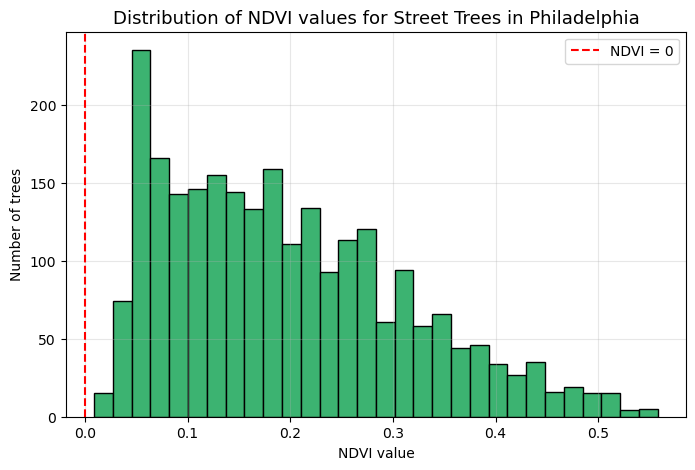

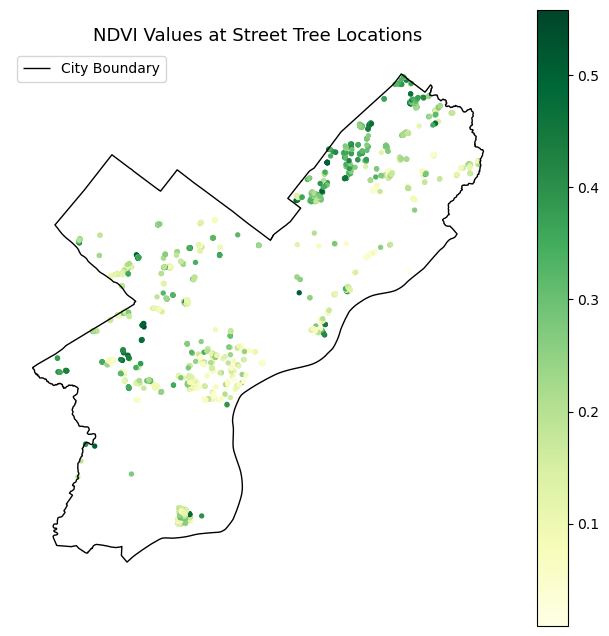

In [92]:
import matplotlib.pyplot as plt

# NDVI Histogram 
plt.figure(figsize=(8,5))
plt.hist(trees["NDVI"].dropna(), bins=30, color="mediumseagreen", edgecolor="black")
plt.axvline(x=0, color='red', linestyle='--', label='NDVI = 0')
plt.title("Distribution of NDVI values for Street Trees in Philadelphia", fontsize=13)
plt.xlabel("NDVI value")
plt.ylabel("Number of trees")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

# Map of Street Tree NDVI 
fig, ax = plt.subplots(figsize=(8,8))
city.boundary.plot(ax=ax, color="black", linewidth=1, label="City Boundary")
trees.plot(ax=ax, column="NDVI", cmap="YlGn", markersize=8, legend=True)
plt.title("NDVI Values at Street Tree Locations", fontsize=13)
plt.axis("off")
plt.legend()
plt.show()
